## Traditional Machine Learning - Xiaojie Shi

In [7]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


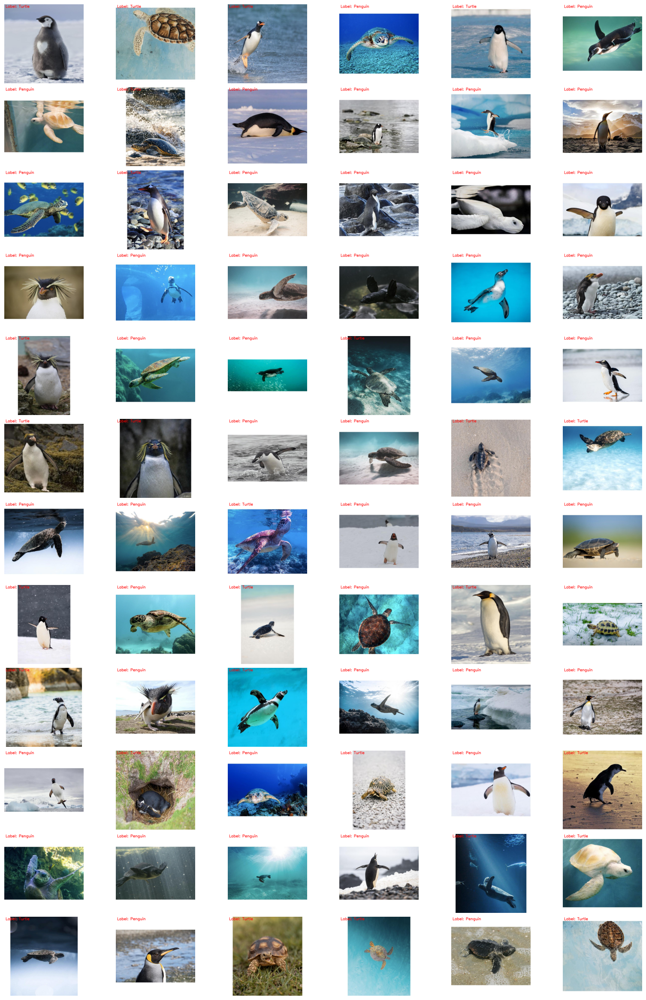

In [13]:
# Methods: HOG + K-Means
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Define the dimensionality after dimensionality reduction
n_components = 100

# Define the paths for training and testing images
train_path = "./archive/train/train"
test_path = "./archive/valid/valid"

# Define the feature extraction method (using HOG as an example)
def extract_features(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Resize the image
    resized_image = cv2.resize(gray_image, (64, 128))  # Resize to 64x128
    winSize = (64, 128)
    blockSize = (16, 16)
    blockStride = (8, 8)
    cellSize = (8, 8)
    nbins = 9

    hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
    hog_features = hog.compute(resized_image)
    hog_features = np.squeeze(hog_features)
    return hog_features

# Load training images and extract features
train_features = []
for i in range(500):
    image_path = os.path.join(train_path, f"image_id_{i:03d}.jpg")
    image = cv2.imread(image_path)
    features = extract_features(image)
    train_features.append(features)
train_features = np.array(train_features).astype(np.float64)

# Perform PCA for dimensionality reduction
pca = PCA(n_components=n_components)
train_features = pca.fit_transform(train_features)

# Use K-Means for clustering
n_clusters = 2  # Two categories: penguins and turtles
kmeans = KMeans(n_clusters=n_clusters, n_init=10)
kmeans.fit(train_features)

# Load test images and annotate them
num_images = 72
num_rows = 12
num_cols = 6
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 30))

for i in range(num_images):
    image_path = os.path.join(test_path, f"image_id_{i:03d}.jpg")
    image = cv2.imread(image_path)
    resized_image = cv2.resize(image, (64, 128))  # Resize to 64x128
    features = extract_features(resized_image)
    test_features = pca.transform([features])  # Perform dimensionality reduction using PCA from the training set
    cluster_label = kmeans.predict(test_features)[0]  # Predict the cluster to which the image belongs
    if cluster_label != 0:
        label = 1  # Penguin
    else:
        label = 2  # Turtle

    if label == 1:
        category = 'Penguin'
    else:
        category = 'Turtle'
    cv2.putText(image, f"Label: {category}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Show the image in the subplot
    ax = axes[i % num_rows, i // num_rows]
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.axis('off')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# Show the images in the notebook
plt.show()

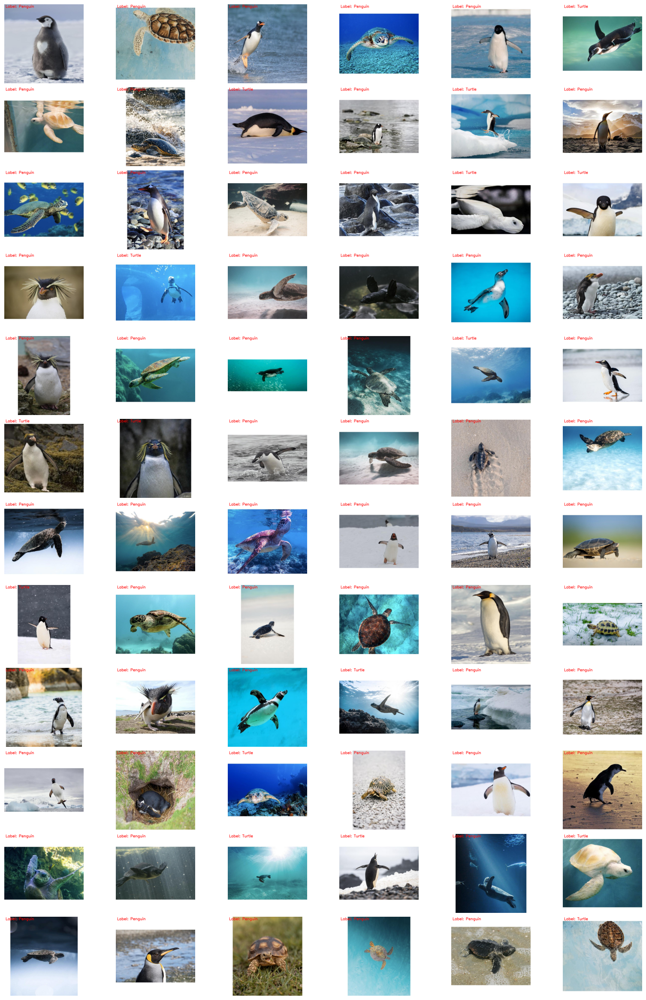

In [15]:
# Methods: HOG + Random Forest
import os
import cv2
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Define the dimensionality after dimensionality reduction
n_components = 100

# Define the paths for training and testing images
train_path = "./archive/train/train"
test_path = "./archive/valid/valid"

# Define the feature extraction method (using HOG as an example)
def extract_features(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Resize the image
    resized_image = cv2.resize(gray_image, (64, 128))  # Resize to 64x128

    hog = cv2.HOGDescriptor()
    hog_features = hog.compute(resized_image)
    hog_features = np.squeeze(hog_features)
    return hog_features

# Load training images and extract features
train_features = []
train_labels = []
for i in range(500):
    image_path = os.path.join(train_path, f"image_id_{i:03d}.jpg")
    image = cv2.imread(image_path)
    features = extract_features(image)
    train_features.append(features)
    if i < 250:
        train_labels.append(1)  # Label 1 for penguin
    else:
        train_labels.append(2)  # Label 2 for turtle

train_features = np.array(train_features).astype(np.float64)

# Perform PCA for dimensionality reduction
pca = PCA(n_components=n_components)
train_features = pca.fit_transform(train_features)

# Use Random Forest for classification
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(train_features, train_labels)

# Load test images and annotate them
num_images = 72
num_rows = 12
num_cols = 6
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 30))

for i in range(num_images):
    image_path = os.path.join(test_path, f"image_id_{i:03d}.jpg")
    image = cv2.imread(image_path)
    resized_image = cv2.resize(image, (64, 128))  # Resize to 64x128
    features = extract_features(resized_image)
    test_features = pca.transform([features])  # Perform dimensionality reduction using PCA from the training set
    predicted_label = rf_classifier.predict(test_features)[0]  # Predict the label for the image

    if predicted_label == 1:
        category = 'Penguin'
    else:
        category = 'Turtle'
    cv2.putText(image, f"Label: {category}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Show the image in the subplot
    ax = axes[i % num_rows, i // num_rows]
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.axis('off')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# Show the images in the notebook
plt.show()

## DeTr - Rui Sun

The run process is split

## MMDetection - Bingyu Yang
The run process is split

## Fast R-CNN - Zhaoyuan Wang

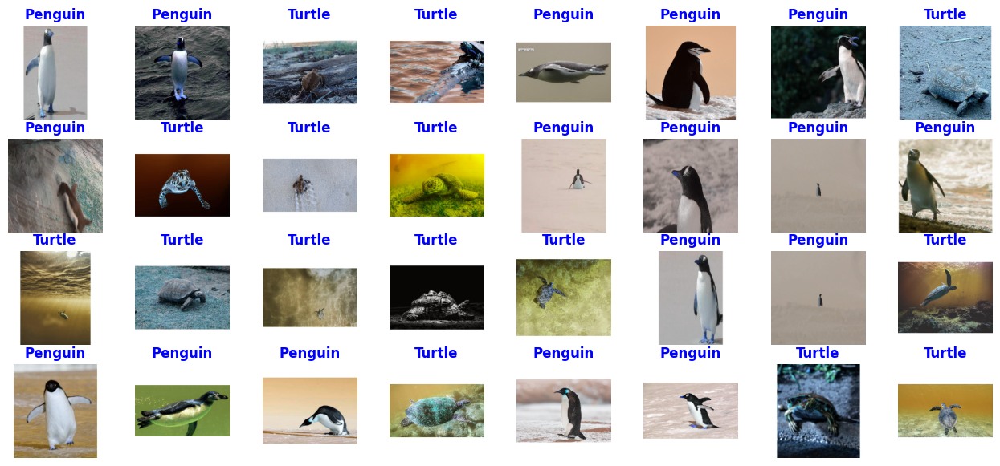

In [22]:
import sys
import numpy as np
import cv2
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Activation, MaxPooling2D
from sklearn.model_selection import train_test_split
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.applications import ResNet50

#load the data
data_path = "./archive/train/train/"
im_size=(200,200)
with open("./archive/train_annotations","r") as file:
    annofile=file.readline().split("},")
with open("./archive/valid_annotations","r") as file:
    validfile=file.readline().split("},")
annofile1=[]
validfile1=[]

#preprocess the annotation data
for i in annofile:
    if i[0]=="[":
        i=i[1:]
    if i[-1] == "]":
        i=i[:-1]
    else:
        i=i+"}"
    i = json.loads(i)
    annofile1.append(i)
for i in validfile:
    if i[0]=="[":
        i=i[1:]
    if i[-1] == "]":
        i=i[:-1]
    else:
        i=i+"}"
    i = json.loads(i)
    validfile1.append(i)
#load the image and the annotation list
peng_train=[]
turt_train=[]
cate_train=[]
peng_test=[]
turt_test=[]
cate_test=[]
x=[]
for i in annofile1:
    cate_train.append(0)
    if i['image_id'] <10:
        file_name ="image_id_00"+str(i['image_id'])
    if i['image_id'] >= 10:
        file_name = "image_id_0" + str(i['image_id'])
    if i['image_id'] >= 100:
        file_name = "image_id_" + str(i['image_id'])
    if i['category_id'] == 1:
        image_path=data_path+file_name+".jpg"
        image=cv2.imread(image_path)
        image=cv2.resize(image,im_size)
        peng_train.append(image)
        x.append(image)
        cate_train[i['image_id']]=1
    if i['category_id'] == 2:
        image_path=data_path+file_name+".jpg"
        image=cv2.imread(image_path)
        image=cv2.resize(image,im_size)
        turt_train.append(image)
        x.append(image)

x_test=[]
data_path="./archive/valid/valid/"
for i in validfile1:
    cate_test.append(0)
    if i['image_id'] <10:
        file_name ="image_id_00"+str(i['image_id'])
    if i['image_id'] >= 10:
        file_name = "image_id_0" + str(i['image_id'])
    if i['image_id'] >= 100:
        file_name = "image_id_" + str(i['image_id'])
    if i['category_id'] == 1:
        image_path=data_path+file_name+".jpg"
        image=cv2.imread(image_path)
        image=cv2.resize(image,im_size)
        peng_test.append(image)
        cate_test[i['image_id']]=1
        x_test.append(image)
    if i['category_id'] == 2:
        image_path=data_path+file_name+".jpg"
        image=cv2.imread(image_path)
        image=cv2.resize(image,im_size)
        turt_test.append(image)
        x_test.append(image)
x_train1, x_test1, y_train1, y_test1 = train_test_split(x, cate_train, test_size=0.2, random_state=1200)

#Show sample images
pointer = -1
figure, axis = plt.subplots(4,8,figsize=(16, 7))
for ax in axis.ravel():
    ax.axis('off')
    pointer+=1
    if cate_train[pointer]==1:
        ax.set_title("Penguin",color = "blue",fontweight='bold')
        ax.imshow(x[pointer])
    else:
        ax.set_title("Turtle",color = "blue",fontweight='bold')
        ax.imshow(x[pointer])


In [23]:
#Normalize pixel values
x=np.array(x).reshape(-1,200,200,3)
x_train1=np.array(x_train1).reshape(-1,200,200,3)
x_test1=np.array(x_test1).reshape(-1,200,200,3)
y_train1=np.array(y_train1)
y_test1=np.array(y_test1)
x_test=np.array(x_test).reshape(-1,200,200,3)
cate_train=np.array(cate_train)
cate_test=np.array(cate_test)
x = x/255.0
x_test = x_test/255.0
x_test1 = x_test1/255.0
x_train1 = x_train1/255.0

#Measure of the CNN model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(200,200,3)))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Conv2D(128,(3,3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Conv2D(256,(3,3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Conv2D(512,(3,3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Dropout(0.1))
model.add(Flatten())
model.add(Dense(256, activation = 'relu'))
model.add(Dense(128, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))
model.compile(optimizer = "adam",
              loss = 'binary_crossentropy',
              metrics = ['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 46, 46, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 23, 23, 128)      0

In [24]:
#Training model
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_acc',
    patience=7,
    restore_best_weights=True
)
history=model.fit(x, cate_train, epochs =100, batch_size = 64, validation_data=(x_test,cate_test),callbacks=[early_stopping],verbose=1)
score = model.evaluate(x_test,cate_test,verbose = 0)
print(f"The accuracy is {score[1]}")

Epoch 1/100
8/8 [==============================] - 78s 9s/step - loss: 0.7248 - acc: 0.4780 - val_loss: 0.6940 - val_acc: 0.5000
Epoch 2/100
8/8 [==============================] - 70s 9s/step - loss: 0.6826 - acc: 0.5320 - val_loss: 0.7267 - val_acc: 0.5000
Epoch 3/100
8/8 [==============================] - 69s 9s/step - loss: 0.6043 - acc: 0.7040 - val_loss: 0.7733 - val_acc: 0.6111
Epoch 4/100
8/8 [==============================] - 65s 8s/step - loss: 0.5220 - acc: 0.7700 - val_loss: 0.7471 - val_acc: 0.5833
Epoch 5/100
8/8 [==============================] - 70s 8s/step - loss: 0.5156 - acc: 0.7740 - val_loss: 0.8443 - val_acc: 0.6250
Epoch 6/100
8/8 [==============================] - 65s 8s/step - loss: 0.5693 - acc: 0.7260 - val_loss: 0.7227 - val_acc: 0.5278
Epoch 7/100
8/8 [==============================] - 69s 9s/step - loss: 0.6186 - acc: 0.6560 - val_loss: 0.6655 - val_acc: 0.5972
Epoch 8/100
8/8 [==============================] - 65s 8s/step - loss: 0.4637 - acc: 0.8020 - val

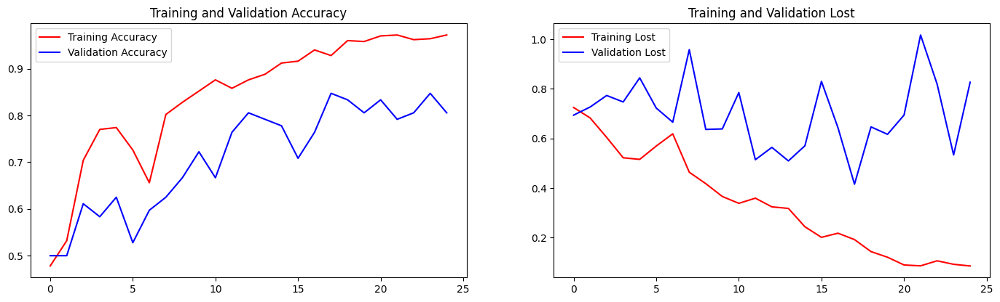

In [26]:
model.save_weights("model.h5")
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.figure(figsize=(17,10))

plt.subplot(221)
plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(222)
plt.plot(epochs, loss, 'r', label='Training Lost')
plt.plot(epochs, val_loss, 'b', label='Validation Lost')
plt.title('Training and Validation Lost')
plt.legend()
plt.show()

In [27]:
model_out = model.predict(x_test)

3/3 [==============================] - 6s 1s/step


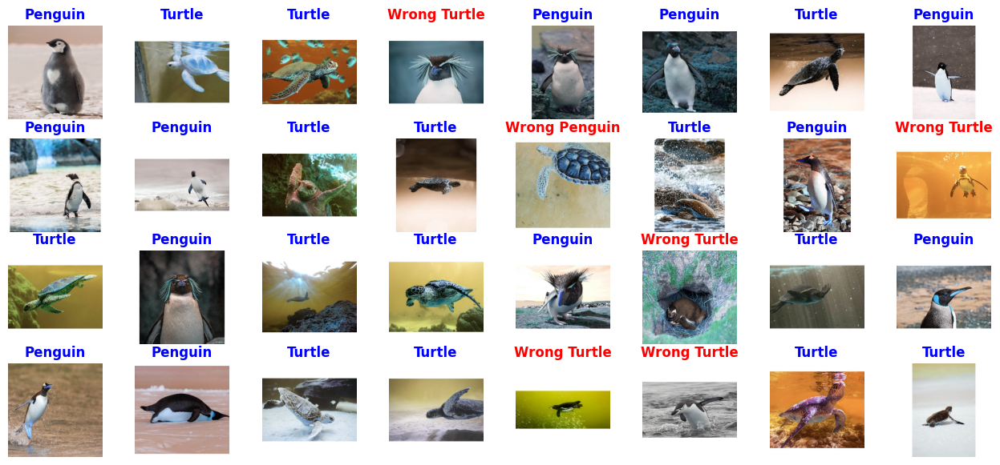

In [28]:
#show some output images
figure, axis = plt.subplots(4,8,figsize=(16, 7))
nm=[]
ax = plt.gca()
for i in model_out:
    if i > 0.5:
        nm.append(1)
    else:nm.append(0)
pointer = -1

for ax in axis.ravel():
    ax.axis('off')
    pointer +=1
    if nm[pointer] == 1:
        if cate_test[pointer] == 0 :
            ax.set_title("Wrong Penguin",color = "red",fontweight='bold')
        if cate_test[pointer] == 1:
            ax.set_title("Penguin",color = "blue",fontweight='bold')
        ax.imshow(x_test[pointer])
    if nm[pointer] == 0:
        if cate_test[pointer] == 1:
            ax.set_title("Wrong Turtle",color = "red",fontweight='bold')
        if cate_test[pointer] == 0:
            ax.set_title("Turtle",color = "blue",fontweight='bold')
        ax.imshow(x_test[pointer])

[[0.44444444 0.05555556]
 [0.09722222 0.40277778]]


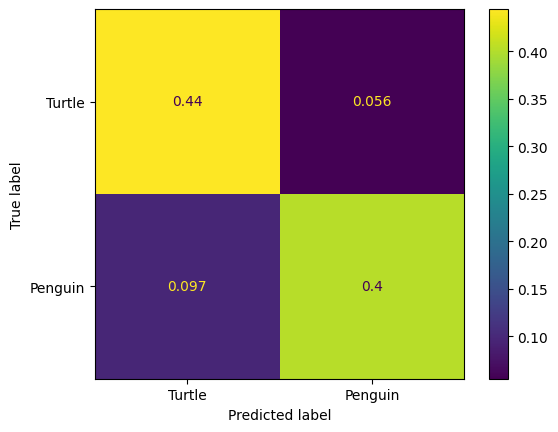

In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

confmat = confusion_matrix(cate_test, nm,normalize='all')
print(confmat)
cm = ConfusionMatrixDisplay(confmat, display_labels = ['Turtle', 'Penguin'])
cm.plot()

In [30]:
#Detecting animals using fasterrcnn
import torch
import torchvision
from torchvision import transforms, datasets
from torchvision.models.detection import *
from xml.etree import ElementTree as et
import numpy as np
from PIL import Image
import torchvision.models.detection as detection
import cv2
model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_320_fpn-907ea3f9.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_320_fpn-907ea3f9.pth
100%|██████████| 74.2M/74.2M [00:01<00:00, 49.0MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(320,), max_size=640, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block): 

In [32]:
def detect_objects(image_path):
    #preprossesing image data
    image = Image.open(image_path).convert("RGB")
    image = transforms.Compose([
        transforms.ToTensor(),
    ])(image)
    #object detecting
    with torch.no_grad():
        detections = model([image])[0]
    boxes = detections['boxes'].data.cpu().numpy()
    labels = detections['labels'].data.cpu().numpy()
    scores = detections['scores'].data.cpu().numpy()
    mask = scores >= 0.6
    return boxes, labels, scores

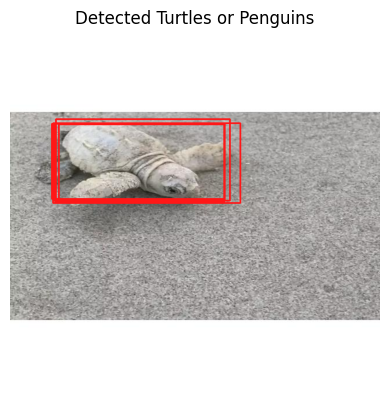

In [39]:
from google.colab.patches import cv2_imshow

#build the rectangle in the pic and show the image
image_path = "./archive/train/train/image_id_367.jpg"
boxes, labels, scores = detect_objects(image_path)
image = cv2.imread(image_path)
for box, label, score in zip(boxes, labels, scores):
        x1, y1, x2, y2 = box.astype(int)
        color = (23,23,255)
        image = cv2.rectangle(image, (x1,y1),(x2,y2),color,2)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Detected Turtles or Penguins')
plt.axis('off') # To hide axis
plt.show()